## 1. Exploración y Preprocesamiento de Datos

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Cargar el conjunto de datos utilizando Pandas

red = pd.read_csv("winequality-red.csv", delimiter=";")
white = pd.read_csv("winequality-white.csv", delimiter=";")

data = pd.concat([red, white], ignore_index=True)

for column in data.columns:
    data[column] = pd.to_numeric(data[column], errors='coerce')

data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [16]:
from ydata_profiling import ProfileReport

profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_ol

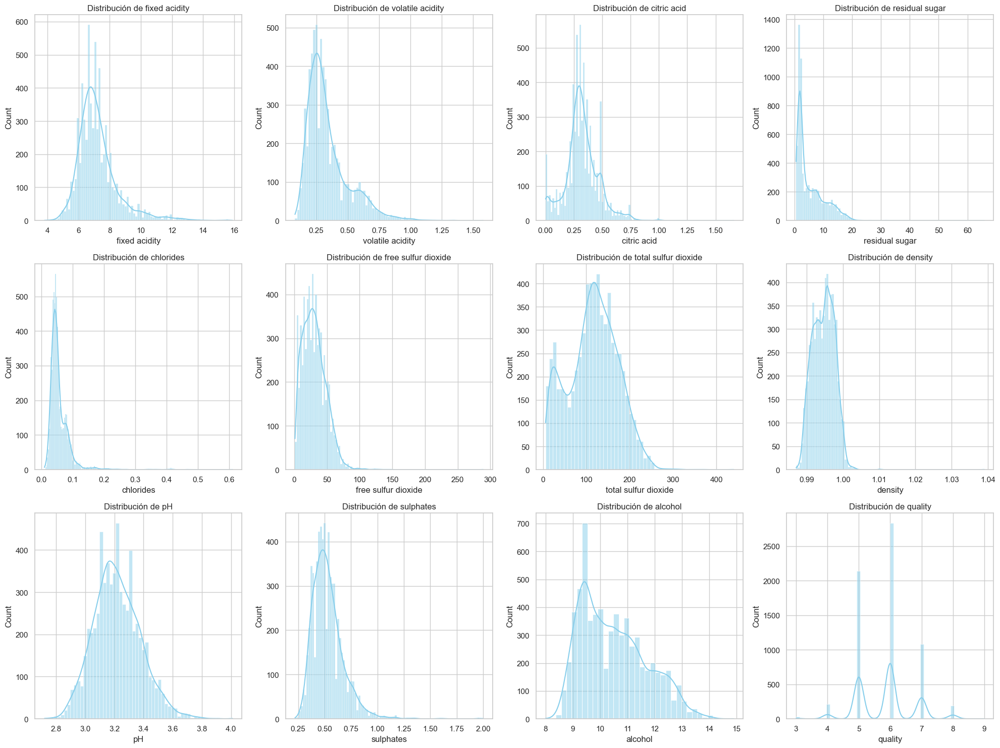

In [8]:
# Realizar un análisis exploratorio de datos (EDA) básico: estadísticas descriptivas, distribución de variables, etc

# Distribución de cada variable

# Configurar el estilo y los ajustes de los gráficos
sns.set(style="whitegrid")

# Calcular el número de filas y columnas para los subplots
num_variables = len(data.columns)
num_columns = 4
num_rows = (num_variables + 1) // num_columns

plt.figure(figsize=(20, 5 * num_rows))  # Ajustar el tamaño vertical según el número de filas

# Iterar sobre las columnas numéricas y crear histogramas y gráficos de densidad
for i, columna in enumerate(data.columns):
    plt.subplot(num_rows, num_columns, i + 1)  # Ajustar la configuración del subplot
    sns.histplot(data=data, x=columna, kde=True, color='skyblue')
    plt.title(f'Distribución de {columna}')

plt.tight_layout()
plt.show()

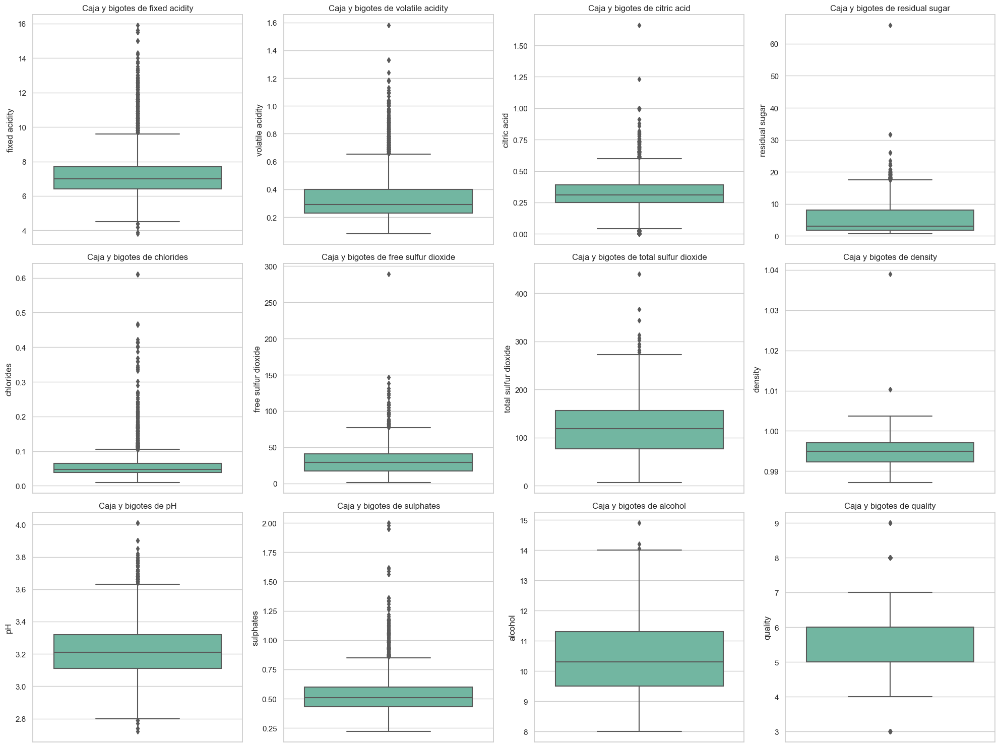

In [11]:
# Diagrama de caja y bigotes de cada variable

# Calcular el número de filas y columnas para los subplots
num_variables = len(data.columns)
num_columns = 4
num_rows = (num_variables + 1) // num_columns

# Configurar el estilo y los ajustes de los gráficos
sns.set(style="whitegrid")
plt.figure(figsize=(20, 5 * num_rows))

# Iterar sobre las columnas numéricas y crear gráficos de caja y bigotes
for i, columna in enumerate(data.columns):
    plt.subplot(num_rows, num_columns, i + 1)  # Ajustar la configuración del subplot
    sns.boxplot(y=data[columna], palette="Set2")
    plt.title(f'Caja y bigotes de {columna}')

plt.tight_layout()
plt.show()

In [15]:
# Matriz de correlación de Pearson entre las variables

correlation_matrix = data.loc[:].corr(method='pearson')
correlation_matrix

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743
volatile acidity,0.219008,1.000000,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699
citric acid,0.324436,-0.377981,1.000000,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532
residual sugar,-0.111981,-0.196011,0.142451,1.000000,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,0.298195,0.377124,0.038998,-0.128940,1.000000,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666
free sulfur dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.195045,1.000000,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463
total sulfur dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.279630,0.720934,1.000000,0.032395,-0.238413,-0.275727,-0.265740,-0.041385
density,0.458910,0.271296,0.096154,0.552517,0.362615,0.025717,0.032395,1.000000,0.011686,0.259478,-0.686745,-0.305858
pH,-0.252700,0.261454,-0.329808,-0.267320,0.044708,-0.145854,-0.238413,0.011686,1.000000,0.192123,0.121248,0.019506
sulphates,0.299568,0.225984,0.056197,-0.185927,0.395593,-0.188457,-0.275727,0.259478,0.192123,1.000000,-0.003029,0.038485


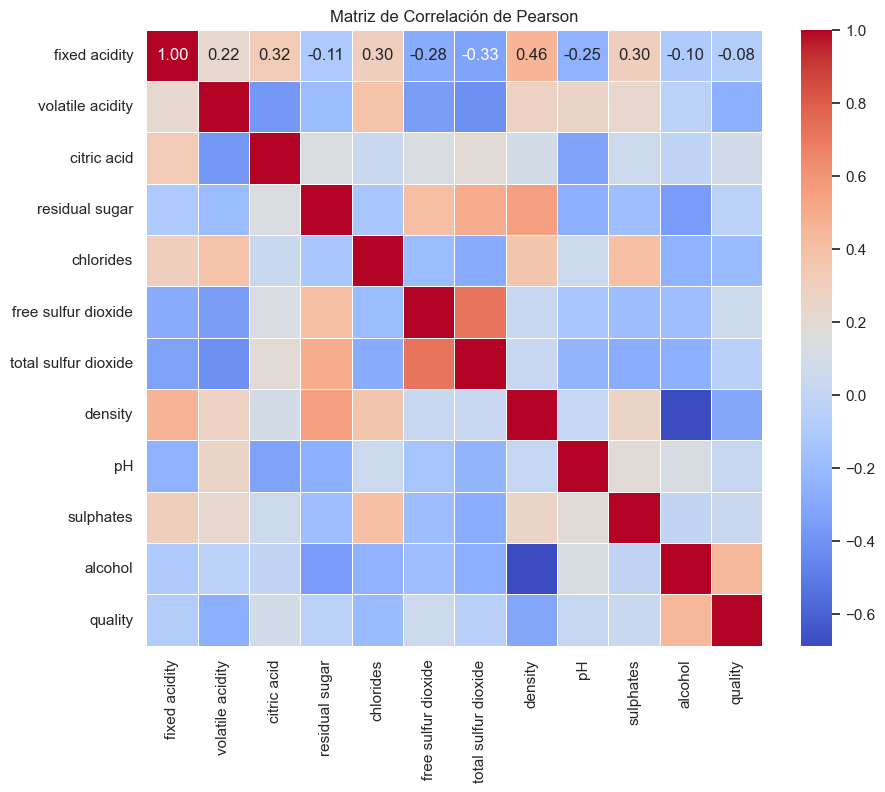

In [16]:
# Generar un mapa de calor para la matriz de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            cbar=True, square=True, linewidths=.5)
plt.title('Matriz de Correlación de Pearson')
plt.show()

In [17]:
# Preprocesar los datos: limpieza, tratamiento de valores faltantes, normalización/estandarización si es necesario

# Calcular el número de valores faltantes por columna
valores_faltantes = data.isnull().sum()

# Imprimir el número de valores faltantes por columna
print("Número de valores faltantes por columna:")
print(valores_faltantes)

Número de valores faltantes por columna:
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


## 2. División del Conjunto de Datos

In [20]:
# Dividir el conjunto de datos en entrenamiento y prueba utilizando una proporción 80-20

X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values

from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 0)

## 3. Selección y Entrenamiento de Modelos

## 4. Validación Cruzada

In [22]:
# Implementar validación cruzada en cada modelo para evaluar su desempeño

from sklearn.preprocessing import StandardScaler

normalizador = StandardScaler()
normalizador.fit(X_entreno)
X_entreno = normalizador.transform(X_entreno)
X_prueba = normalizador.transform(X_prueba)

from sklearn.model_selection import cross_validate

## Regresión Logística

In [26]:
from sklearn.linear_model import LogisticRegression
clasif_reg_log = LogisticRegression(random_state = 0)

calificaciones = cross_validate(clasif_reg_log, X_entreno, y_entreno,
                         scoring = ['accuracy', 'roc_auc', 'recall', 'precision', 'f1'],
                         cv = 10)

pd.DataFrame(calificaciones).mean()

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:1006: UserWarning: Scoring failed. The score on this train-test partition for these parameters wil

fit_time          0.100898
score_time        0.034243
test_accuracy     0.542811
test_roc_auc           NaN
test_recall            NaN
test_precision         NaN
test_f1                NaN
dtype: float64

In [28]:
# Aplicando los cambios según las calificaciones

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score

# Configuración del modelo y validación cruzada
clasif_reg_log = LogisticRegression(random_state=0, max_iter=1000)
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

# Evaluación de la precisión
scores = cross_val_score(clasif_reg_log, X_entreno, y_entreno, cv=cv, scoring='accuracy')
print("Accuracy promedio: %0.2f (desviación estándar: %0.2f)" % (scores.mean(), scores.std()))

# Predicciones y matriz de confusión
y_pred = cross_val_predict(clasif_reg_log, X_prueba, y_prueba, cv=cv)
matconf = confusion_matrix(y_prueba, y_pred)
print("Número de etiquetas reales vs predichas:")
print(len(y_prueba), len(y_pred))
print("Matriz de Confusión:")
print(matconf)

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


Accuracy promedio: 0.55 (desviación estándar: 0.02)


c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


Número de etiquetas reales vs predichas:
1300 1300
Matriz de Confusión:
[[  0   0   5   2   0   0   0]
 [  0   2  34  12   0   0   0]
 [  0   1 231 178   3   0   0]
 [  0   1 130 403  45   0   0]
 [  0   0  16 145  50   0   0]
 [  0   0   5  28   8   0   0]
 [  0   0   0   0   1   0   0]]


## Regresión lineal múltiple

In [31]:
from sklearn.linear_model import LinearRegression
regresor = LinearRegression()

calificaciones = cross_validate(regresor, X_entreno, y_entreno,
                         scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'max_error'],
                         cv = 10)

pd.DataFrame(calificaciones).mean()

fit_time                        0.002976
score_time                      0.003225
test_r2                         0.285358
test_neg_mean_absolute_error   -0.566511
test_neg_mean_squared_error    -0.541731
test_max_error                 -3.077747
dtype: float64

In [34]:
# Aplicando los cambios según las calificaciones

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold
from sklearn.metrics import r2_score

# Configuración del modelo y validación cruzada
regresor = LinearRegression()
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=0)

# Evaluación de la precisión
scores = cross_val_score(regresor, X_entreno, y_entreno, cv=cv, scoring='r2')
print("Accuracy promedio: %0.2f (desviación estándar: %0.2f)" % (scores.mean(), scores.std()))

# Predicciones
y_pred = cross_val_predict(clasif_reg_log, X_prueba, y_prueba, cv=cv)
matconf = confusion_matrix(y_prueba, y_pred)
print("Número de etiquetas reales vs predichas:")
print(len(y_prueba), len(y_pred))

c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
c:\Users\Pablo Zamora\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_split.py:737: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=10.
  warnings.warn(


Accuracy promedio: 0.29 (desviación estándar: 0.03)
Número de etiquetas reales vs predichas:
1300 1300
